In [1]:
!pip show keras

Name: Keras
Version: 2.2.4
Summary: Deep Learning for humans
Home-page: https://github.com/keras-team/keras
Author: Francois Chollet
Author-email: francois.chollet@gmail.com
License: MIT
Location: c:\users\fbk\anaconda3\lib\site-packages
Requires: six, pyyaml, keras-applications, keras-preprocessing, numpy, scipy, h5py
Required-by: tensorflow-gpu


# [keras-yolo3](https://github.com/qqwweee/keras-yolo3)

### 1. Download YOLOv3 weight from [YOLO website](http://pjreddie.com/darknet/yolo/)

In [2]:
#wget https://pjreddie.com/media/files/yolov3.weights

SyntaxError: invalid syntax (Temp/ipykernel_7152/1934090116.py, line 1)

### 2. Convert the Darknet YOLO model to a Keras model
- Need below three file to convert
 - convert.py, yolov3.cfg (exists in keras-yolo3)
 - yolov3.weights (downloaded)

In [3]:
!python convert.py yolov3.cfg yolov3.weights model_data/yolo.h5

Loading weights.
Weights Header:  0 2 0 [32013312]
Parsing Darknet config.
Creating Keras model.
Parsing section net_0
Parsing section convolutional_0
conv2d bn leaky (3, 3, 3, 32)
Parsing section convolutional_1
conv2d bn leaky (3, 3, 32, 64)
Parsing section convolutional_2
conv2d bn leaky (1, 1, 64, 32)
Parsing section convolutional_3
conv2d bn leaky (3, 3, 32, 64)
Parsing section shortcut_0
Parsing section convolutional_4
conv2d bn leaky (3, 3, 64, 128)
Parsing section convolutional_5
conv2d bn leaky (1, 1, 128, 64)
Parsing section convolutional_6
conv2d bn leaky (3, 3, 64, 128)
Parsing section shortcut_1
Parsing section convolutional_7
conv2d bn leaky (1, 1, 128, 64)
Parsing section convolutional_8
conv2d bn leaky (3, 3, 64, 128)
Parsing section shortcut_2
Parsing section convolutional_9
conv2d bn leaky (3, 3, 128, 256)
Parsing section convolutional_10
conv2d bn leaky (1, 1, 256, 128)
Parsing section convolutional_11
conv2d bn leaky (3, 3, 128, 256)
Parsing section shortcut_3
Parsi

Using TensorFlow backend.
Instructions for updating:
non-resource variables are not supported in the long term
2021-12-02 13:09:07.640391: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX AVX2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2021-12-02 13:09:07.644516: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'nvcuda.dll'; dlerror: nvcuda.dll not found
2021-12-02 13:09:07.644553: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2021-12-02 13:09:07.662878: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:169] retrieving CUDA diagnostic information for host: DESKTOP-FBKLAB
2021-12-02 13:09:07.663022: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:176] hostname: DESKTOP

__________________________________________________________________________________________________
leaky_re_lu_2 (LeakyReLU)       (None, None, None, 6 0           batch_normalization_2[0][0]      
__________________________________________________________________________________________________
conv2d_3 (Conv2D)               (None, None, None, 3 2048        leaky_re_lu_2[0][0]              
__________________________________________________________________________________________________
batch_normalization_3 (BatchNor (None, None, None, 3 128         conv2d_3[0][0]                   
__________________________________________________________________________________________________
leaky_re_lu_3 (LeakyReLU)       (None, None, None, 3 0           batch_normalization_3[0][0]      
__________________________________________________________________________________________________
conv2d_4 (Conv2D)               (None, None, None, 6 18432       leaky_re_lu_3[0][0]              
__________

__________________________________________________________________________________________________
batch_normalization_48 (BatchNo (None, None, None, 1 4096        conv2d_48[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu_48 (LeakyReLU)      (None, None, None, 1 0           batch_normalization_48[0][0]     
__________________________________________________________________________________________________
add_21 (Add)                    (None, None, None, 1 0           add_20[0][0]                     
                                                                 leaky_re_lu_48[0][0]             
__________________________________________________________________________________________________
conv2d_49 (Conv2D)              (None, None, None, 5 524288      add_21[0][0]                     
__________________________________________________________________________________________________
batch_norm

### 3. Object detection

In [5]:
!pip show keras

Name: keras
Version: 2.6.0
Summary: TensorFlow Keras.
Home-page: https://keras.io/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: c:\users\fbk\anaconda3\lib\site-packages
Requires: 
Required-by: tensorflow-gpu


In [3]:
from IPython.display import display 
from PIL import Image
from yolo import YOLO

'''
    yolo = YOLO(model_path=model_path, classes_path=class_path, anchors_path="model_data/yolo_tiny_anchors.txt")
    image = Image.open(file)
    result_image = yolo.detect_image(image)
    display(result_image)
'''
import tensorflow.compat.v1.keras.backend as K
#import tensorflow.keras.backend as K
import tensorflow as tf
tf.compat.v1.disable_eager_execution()

def objectDetection(file, model_path, class_path):
    yolo = YOLO(model_path=model_path, classes_path=class_path)

    # 이미지 로딩
    image = Image.open(file)
    #model = yolo.get_model()
    #model.summary()

    # 실행
    result_image = yolo.detect_image(image)

    # 실행 결과 표시
    display(result_image)

model_data/yolo.h5 model, anchors, and classes loaded.
(416, 416, 3)
Found 1 boxes for img
diningtable 0.80 (187, 12) (4136, 2329)
3.1705881999999974


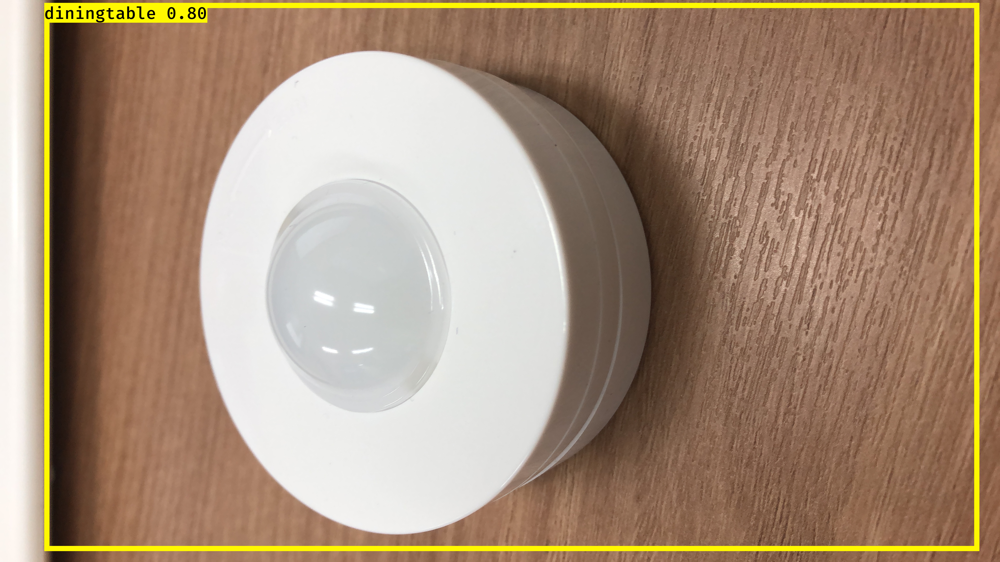

In [4]:
objectDetection('data/light/images_test/IMG_3083.JPG', 'model_data/yolo.h5', 'model_data/coco_classes.txt')

# YOLO Custom data training

### 1. Convert VOC dataset to YOLO annotation
- copy and modified from voc_annotation.py

In [6]:
pwd

'C:\\Users\\FBK\\Documents\\jupyter\\1202_yolo3'

In [7]:
# Get class list
def load_classes():
    with open('./data/light/classes.txt') as f:
        classes = f.read().splitlines()
    return classes

classes = load_classes()
print(classes)

['bulb']


In [8]:
# Get annotations_voc list
import glob

annotations_voc = glob.glob('./data/light/annotations_voc/*.xml')
print(annotations_voc)

['./data/light/annotations_voc\\IMG_3066.xml', './data/light/annotations_voc\\IMG_3067.xml', './data/light/annotations_voc\\IMG_3068.xml', './data/light/annotations_voc\\IMG_3069.xml', './data/light/annotations_voc\\IMG_3070.xml', './data/light/annotations_voc\\IMG_3071.xml', './data/light/annotations_voc\\IMG_3072.xml', './data/light/annotations_voc\\IMG_3073.xml', './data/light/annotations_voc\\IMG_3074.xml', './data/light/annotations_voc\\IMG_3075.xml', './data/light/annotations_voc\\IMG_3076.xml', './data/light/annotations_voc\\IMG_3077.xml', './data/light/annotations_voc\\IMG_3078.xml', './data/light/annotations_voc\\IMG_3079.xml', './data/light/annotations_voc\\IMG_3080.xml', './data/light/annotations_voc\\IMG_3081.xml', './data/light/annotations_voc\\IMG_3082.xml']


In [9]:
import xml.etree.ElementTree as ET
from os import getcwd

def convert_annotation(annotation_voc, converted_file):
    tree = ET.parse(annotation_voc)
    root = tree.getroot()

    for obj in root.iter('object'):
        difficult = obj.find('difficult').text
        cls = obj.find('name').text
        if cls not in classes or int(difficult)==1:
            continue
        cls_id = classes.index(cls)
        xmlbox = obj.find('bndbox')
        b = (int(xmlbox.find('xmin').text), int(xmlbox.find('ymin').text), int(xmlbox.find('xmax').text), int(xmlbox.find('ymax').text))
        converted_file.write(" " + ",".join([str(a) for a in b]) + ',' + str(cls_id))

converted_file = open('./data/light/annotations_yolo/train_all.txt', 'w')
for annotation_voc in annotations_voc:
    image_id = annotation_voc.split('/')[-1].split('.')[0]+'.JPG'
    converted_file.write('./data/light/images_train/%s'%(image_id))
    convert_annotation(annotation_voc, converted_file)
    converted_file.write('\n')
converted_file.close()

In [10]:
#!cat data/light/annotations_yolo/train_all.txt

In [2]:
# Get class list
def load_texts():
    with open('./data/light/annotations_yolo/train_all.txt') as f:
        texts = f.read().splitlines()
    return texts

texts = load_texts()
print(texts)

['./data/light/images_train\\IMG_3066.JPG 36,11,92,68,0', './data/light/images_train\\IMG_3067.JPG 30,79,127,173,0', './data/light/images_train\\IMG_3068.JPG 41,58,147,156,0', './data/light/images_train\\IMG_3069.JPG 33,109,108,184,0', './data/light/images_train\\IMG_3070.JPG 61,125,104,168,0', './data/light/images_train\\IMG_3071.JPG 33,83,131,182,0', './data/light/images_train\\IMG_3072.JPG 25,99,99,173,0', './data/light/images_train\\IMG_3073.JPG 37,110,119,192,0', './data/light/images_train\\IMG_3074.JPG 48,119,137,212,0', './data/light/images_train\\IMG_3075.JPG 39,104,105,170,0', './data/light/images_train\\IMG_3076.JPG 35,127,107,202,0', './data/light/images_train\\IMG_3077.JPG 40,87,132,178,0', './data/light/images_train\\IMG_3078.JPG 32,95,100,161,0', './data/light/images_train\\IMG_3079.JPG 42,110,139,207,0', './data/light/images_train\\IMG_3080.JPG 13,97,102,187,0', './data/light/images_train\\IMG_3081.JPG 32,108,116,194,0', './data/light/images_train\\IMG_3082.JPG 20,84,115

### 2. Retrain the YOLO model for custom dataset
- copy and modified from train.py

In [ ]:
"""
Retrain the YOLO model for your own dataset.
"""

import numpy as np
import tensorflow.compat.v1.keras.backend as K #import keras.backend as K
from keras.layers import Input, Lambda
from keras.models import Model
#from keras.optimizers import Adam
from tensorflow.keras.optimizers import Adam
from keras.callbacks import TensorBoard, ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

from yolo3.model import preprocess_true_boxes, yolo_body, tiny_yolo_body, yolo_loss
from yolo3.utils import get_random_data

import os

def _main():
    annotation_path = 'data/light/annotations_yolo/train_all.txt'
    log_dir = 'logs/000/'
    classes_path = 'data/light/classes.txt'
    anchors_path = 'model_data/yolo_anchors.txt'
    class_names = get_classes(classes_path)
    num_classes = len(class_names)
    anchors = get_anchors(anchors_path)

    input_shape = (416,416) # multiple of 32, hw

    is_tiny_version = len(anchors)==6 # default setting
    if is_tiny_version:
        #_light
        model = create_tiny_model(input_shape,
                                  anchors,
                                  num_classes,
                                  freeze_body=2,
                                  weights_path='model_data/yolo-tiny.h5')
    else:
        # _light
        model = create_model(input_shape,
                             anchors,
                             num_classes,
                             freeze_body=2,
                             weights_path='model_data/yolo.h5')

    logging = TensorBoard(log_dir=log_dir)
    checkpoint = ModelCheckpoint(log_dir + 'ep{epoch:03d}-loss{loss:.3f}-val_loss{val_loss:.3f}.h5',
        monitor='val_loss', save_weights_only=True, save_best_only=True, period=3)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1)
    early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1)

    val_split = 0.1
    with open(annotation_path) as f:
        lines = f.readlines()
    np.random.seed(10101)
    np.random.shuffle(lines)
    np.random.seed(None)
    num_val = int(len(lines)*val_split)
    num_train = len(lines) - num_val

    # Train with frozen layers first, to get a stable loss.
    # Adjust num epochs to your dataset. This step is enough to obtain a not bad model.
    if True:
        model.compile(optimizer=Adam(lr=1e-3), loss={
            # use custom yolo_loss Lambda layer.
            'yolo_loss': lambda y_true, y_pred: y_pred})

        batch_size = 32
        print('Train on {} samples, val on {} samples, with batch size {}.'.format(num_train, num_val, batch_size))
        model.fit_generator(data_generator_wrapper(lines[:num_train], batch_size, input_shape, anchors, num_classes),
                steps_per_epoch=max(1, num_train//batch_size),
                validation_data=data_generator_wrapper(lines[num_train:], batch_size, input_shape, anchors, num_classes),
                validation_steps=max(1, num_val//batch_size),
                epochs=5,
                initial_epoch=0,
                callbacks=[logging, checkpoint])
        model.save_weights(log_dir + 'trained_weights_stage_1.h5')

    # Unfreeze and continue training, to fine-tune.
    # Train longer if the result is not good.
    if True:
        for i in range(len(model.layers)):
            model.layers[i].trainable = True
        model.compile(optimizer=Adam(lr=1e-4), loss={'yolo_loss': lambda y_true, y_pred: y_pred}) # recompile to apply the change
        print('Unfreeze all of the layers.')

        batch_size = 32 # note that more GPU memory is required after unfreezing the body
        print('Train on {} samples, val on {} samples, with batch size {}.'.format(num_train, num_val, batch_size))
        model.fit_generator(data_generator_wrapper(lines[:num_train], batch_size, input_shape, anchors, num_classes),
            steps_per_epoch=max(1, num_train//batch_size),
            validation_data=data_generator_wrapper(lines[num_train:], batch_size, input_shape, anchors, num_classes),
            validation_steps=max(1, num_val//batch_size),
            epochs=100,
            initial_epoch=50,
            callbacks=[logging, checkpoint, reduce_lr, early_stopping])
        if not os.path.exists(log_dir):
            os.makedirs(log_dir)
        model.save_weights(log_dir + 'trained_weights_final.h5')

    # Further training if needed.


def get_classes(classes_path):
    '''loads the classes'''
    with open(classes_path) as f:
        class_names = f.readlines()
    class_names = [c.strip() for c in class_names]
    return class_names

def get_anchors(anchors_path):
    '''loads the anchors from a file'''
    with open(anchors_path) as f:
        anchors = f.readline()
    anchors = [float(x) for x in anchors.split(',')]
    return np.array(anchors).reshape(-1, 2)


def create_model(input_shape, anchors, num_classes, load_pretrained=True, freeze_body=2,
            weights_path='model_data/yolo.h5'):
    '''create the training model'''
    K.clear_session() # get a new session
    image_input = Input(shape=(None, None, 3))
    h, w = input_shape
    num_anchors = len(anchors)

    y_true = [Input(shape=(h//{0:32, 1:16, 2:8}[l], w//{0:32, 1:16, 2:8}[l], \
        num_anchors//3, num_classes+5)) for l in range(3)]

    model_body = yolo_body(image_input, num_anchors//3, num_classes)
    print('Create YOLOv3 model with {} anchors and {} classes.'.format(num_anchors, num_classes))

    if load_pretrained:
        model_body.load_weights(weights_path, by_name=True, skip_mismatch=True)
        print('Load weights {}.'.format(weights_path))
        if freeze_body in [1, 2]:
            # Freeze darknet53 body or freeze all but 3 output layers.
            num = (185, len(model_body.layers)-3)[freeze_body-1]
            for i in range(num): model_body.layers[i].trainable = False
            print('Freeze the first {} layers of total {} layers.'.format(num, len(model_body.layers)))

    model_loss = Lambda(yolo_loss, output_shape=(1,), name='yolo_loss',
        arguments={'anchors': anchors, 'num_classes': num_classes, 'ignore_thresh': 0.5})(
        [*model_body.output, *y_true])
    model = Model([model_body.input, *y_true], model_loss)

    return model

#tiny_yolo_weights.h5'
def create_tiny_model(input_shape, anchors, num_classes, load_pretrained=True, freeze_body=2,
            weights_path='model_data/yolo-tiny.h5'):
    '''create the training model, for Tiny YOLOv3'''
    K.clear_session() # get a new session
    image_input = Input(shape=(None, None, 3))
    h, w = input_shape
    num_anchors = len(anchors)

    y_true = [Input(shape=(h//{0:32, 1:16}[l], w//{0:32, 1:16}[l], \
        num_anchors//2, num_classes+5)) for l in range(2)]

    model_body = tiny_yolo_body(image_input, num_anchors//2, num_classes)
    print('Create Tiny YOLOv3 model with {} anchors and {} classes.'.format(num_anchors, num_classes))

    if load_pretrained:
        model_body.load_weights(weights_path, by_name=True, skip_mismatch=True)
        print('Load weights {}.'.format(weights_path))
        if freeze_body in [1, 2]:
            # Freeze the darknet body or freeze all but 2 output layers.
            num = (20, len(model_body.layers)-2)[freeze_body-1]
            for i in range(num): model_body.layers[i].trainable = False
            print('Freeze the first {} layers of total {} layers.'.format(num, len(model_body.layers)))

    model_loss = Lambda(yolo_loss, output_shape=(1,), name='yolo_loss',
        arguments={'anchors': anchors, 'num_classes': num_classes, 'ignore_thresh': 0.7})(
        [*model_body.output, *y_true])
    model = Model([model_body.input, *y_true], model_loss)

    return model

def data_generator(annotation_lines, batch_size, input_shape, anchors, num_classes):
    '''data generator for fit_generator'''
    n = len(annotation_lines)
    i = 0
    while True:
        image_data = []
        box_data = []
        for b in range(batch_size):
            if i==0:
                np.random.shuffle(annotation_lines)
            image, box = get_random_data(annotation_lines[i], input_shape, random=True)
            image_data.append(image)
            box_data.append(box)
            i = (i+1) % n
        image_data = np.array(image_data)
        box_data = np.array(box_data)
        y_true = preprocess_true_boxes(box_data, input_shape, anchors, num_classes)
        yield [image_data, *y_true], np.zeros(batch_size)

def data_generator_wrapper(annotation_lines, batch_size, input_shape, anchors, num_classes):
    n = len(annotation_lines)
    if n==0 or batch_size<=0: return None
    return data_generator(annotation_lines, batch_size, input_shape, anchors, num_classes)

if __name__ == '__main__':
    _main()

Create YOLOv3 model with 9 anchors and 1 classes.


Load weights model_data/yolo.h5.
Freeze the first 249 layers of total 252 layers.
Train on 16 samples, val on 1 samples, with batch size 32.


C:\Users\FBK\anaconda3\lib\site-packages\keras\optimizer_v2\optimizer_v2.py:355: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(
C:\Users\FBK\anaconda3\lib\site-packages\keras\engine\training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
C:\Users\FBK\anaconda3\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 1/5
1/1 [==============================] - 28s 28s/step - loss: 9537.7227 - val_loss: 9191.1943
Epoch 2/5
1/1 [==============================] - 20s 20s/step - loss: 9188.2227 - val_loss: 8867.4727
Epoch 3/5
1/1 [==============================] - 19s 19s/step - loss: 8813.4482 - val_loss: 8587.3955
Epoch 4/5
1/1 [==============================] - 19s 19s/step - loss: 8515.3574 - val_loss: 8148.6514
Epoch 5/5
1/1 [==============================] - ETA: 0s - loss: 8185.1450

In [1]:
import keras
print(keras.__version__)

2.6.0


In [4]:
#!pip show h5py

Name: h5py
Version: 3.1.0
Summary: Read and write HDF5 files from Python
Home-page: http://www.h5py.org
Author: Andrew Collette
Author-email: andrew.collette@gmail.com
License: BSD
Location: c:\users\fbk\anaconda3\lib\site-packages
Requires: numpy
Required-by: tensorflow-gpu, Keras, Keras-Applications


In [3]:
#!pip show h5py -> 원래: 3.1.0
#!pip install h5py==2.10.0

In [4]:
#!pip install keras==2.6.0
#!pip uninstall keras
#!pip install keras==2.2.4
#import keras
#print(keras.__version__)

  Using cached keras-2.6.0-py2.py3-none-any.whl (1.3 MB)
  Attempting uninstall: keras
    Found existing installation: Keras 2.2.4
    Uninstalling Keras-2.2.4:
      Successfully uninstalled Keras-2.2.4


In [18]:
#finally solved the problem by downgrading my Keras from version 2.3 to 2.1.5.
#!pip show keras # -> 2.6.0
#!pip install keras==2.6.0
#!pip show tensorflow-gpu ->2.6.0
#!pip uninstall -y tensorflow
#!pip install tensorflow-gpu==1.14.0

Name: Keras
Version: 2.2.4
Summary: Deep Learning for humans
Home-page: https://github.com/keras-team/keras
Author: Francois Chollet
Author-email: francois.chollet@gmail.com
License: MIT
Location: c:\users\fbk\anaconda3\lib\site-packages
Requires: pyyaml, keras-applications, six, keras-preprocessing, h5py, scipy, numpy
Required-by: tensorflow-gpu


### 3. Test

In [1]:
from IPython.display import display 
from PIL import Image
from yolo import YOLO

import tensorflow.compat.v1.keras.backend as K
import tensorflow as tf
tf.compat.v1.disable_eager_execution()

def objectDetection(file, model_path, class_path):
    yolo = YOLO(model_path=model_path, classes_path=class_path, anchors_path="model_data/yolo_anchors.txt")
    #model = yolo.get_model()
    #model.summary()

    # 이미지 로딩
    image = Image.open(file)

    # 실행
    result_image = yolo.detect_image(image)

    # 실행 결과 표시
    display(result_image)

In [50]:
objectDetection('data/light/IMG_3178.PNG', 'model_data/yolo.h5', 'data/light/classes.txt')

AssertionError: Mismatch between model and given anchor and class sizes

Instructions for updating:
Colocations handled automatically by placer.
logs/000/trained_weights_stage_1.h5 model, anchors, and classes loaded.
(416, 416, 3)
Found 20 boxes for img
bulb 0.40 (583, 187) (721, 275)
bulb 0.40 (276, 640) (413, 746)
bulb 0.40 (570, 0) (735, 92)
bulb 0.40 (371, 696) (524, 792)
bulb 0.40 (149, 64) (337, 193)
bulb 0.41 (274, 585) (413, 700)
bulb 0.41 (468, 0) (631, 90)
bulb 0.41 (722, 123) (750, 240)
bulb 0.41 (353, 15) (536, 138)
bulb 0.41 (549, 19) (750, 135)
bulb 0.42 (427, 123) (571, 234)
bulb 0.42 (259, 66) (432, 191)
bulb 0.42 (718, 72) (750, 192)
bulb 0.42 (626, 127) (750, 234)
bulb 0.43 (364, 9) (745, 157)
bulb 0.43 (455, 17) (638, 137)
bulb 0.43 (529, 126) (672, 236)
bulb 0.44 (566, 73) (737, 191)
bulb 0.45 (358, 70) (537, 189)
bulb 0.46 (464, 74) (633, 187)
1.6075189000000023


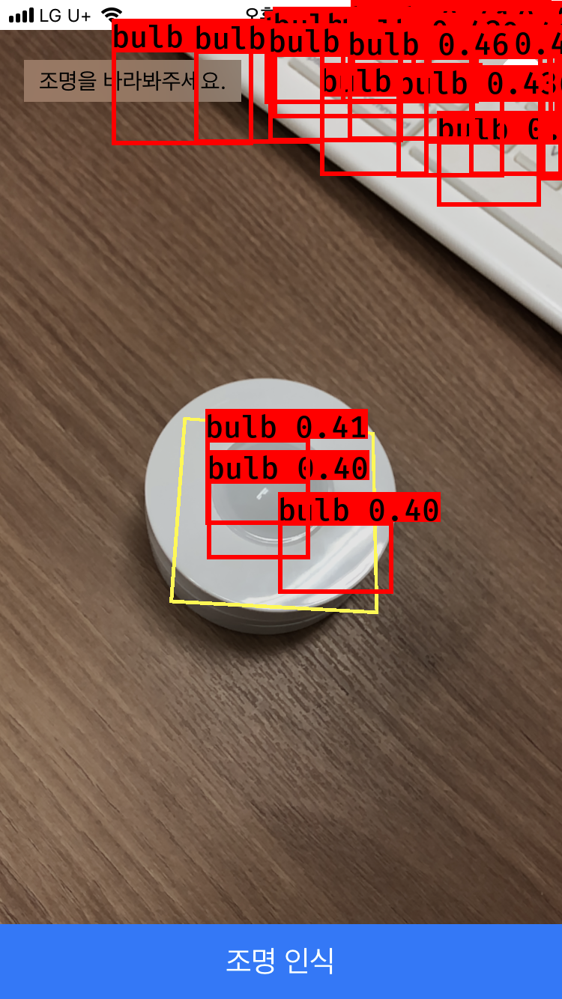

In [2]:
objectDetection('data/light/IMG_3178.PNG', 'logs/000/trained_weights_stage_1.h5', 'data/light/classes.txt')

# Convert Keras h5 model to CoreML mlmodel
- [How to load yolo model](https://github.com/qqwweee/keras-yolo3/issues/48)

In [ ]:
from yolo import YOLO
yolo = YOLO(model_path='data/light/trained_weights_final.h5', classes_path='data/light/classes.txt')
model = yolo.get_model()
model.save('data/light/LightModel.h5')

In [ ]:
model.summary()

In [ ]:
import coremltools
def getClasses(classes_path):
    with open(classes_path) as f:
        classes = f.read().splitlines()
    return classes

coreml_model = coremltools.converters.keras.convert('data/light/LightModel.h5',
                                                    image_input_names='image',
                                                    input_names="image",
                                                    output_names=['grid'],
                                                    image_scale=1/255.0)
coreml_model.author = 'nero'
coreml_model.short_description = 'Light Recognition Model'
coreml_model.input_description['image'] = 'Takes as input an image of a light'
coreml_model.output_description['grid'] = 'The 52 * 52 grid with the bounding box data'
coreml_model.save('data/light/LightModel2.mlmodel')

In [ ]:
import numpy as np
import PIL
from PIL import Image
import coremltools
import matplotlib.pyplot as plt
%matplotlib inline

def testMLModel(file, model_path):
    lightModel = coremltools.models.MLModel(model_path)

    # 이미지 로딩
    image = Image.open(file)

    # Error : https://github.com/apple/coremltools/issues/317
    # Unable to load CoreML.framework. Cannot make predictions.
    result_image = lightModel.predict({'image': image})

    # 실행 결과 표시
    print(result_image)

In [ ]:
testMLModel('data/light/images_test/IMG_3169.JPG', 'data/light/LightModel.mlmodel')